In [1]:
#install packages
import os
import argparse
#!pip install bnlearn
import bnlearn as bn
#from bn.feature_extraction.models import Discretize


#load packages
import numpy as np
import pandas as pd
from ipywidgets import widgets
from pandas_profiling import ProfileReport
import statsmodels.api as sm
import matplotlib.pyplot as plt

In [2]:
#import the dataset
wine = pd.read_csv("winequality-red.csv", sep = ";")
good_quality = wine[wine['quality'] > 3]

#attach the dataset
wine.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [3]:
# generate profile for wine data
profile = ProfileReport(wine, title="Wine quality data profiling report", html={'style': {'full_width': True}})
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

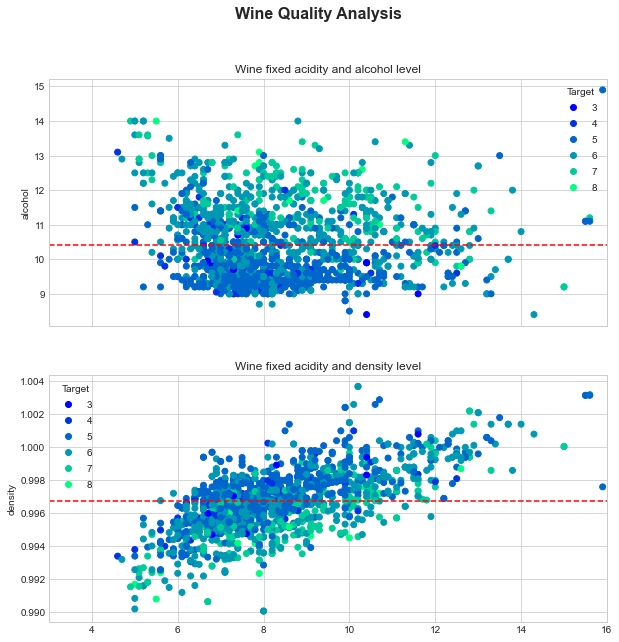

In [8]:
# plots
%matplotlib inline
plt.style.use('seaborn-whitegrid') # set plot style

# create plots with two rows
fig, (ax0, ax1) = plt.subplots(nrows = 2,
                               ncols = 1,
                               sharex = True,
                               figsize = (10, 10))

# add data, titles, meanline (axhline) and legend to axes 0
scatter = ax0.scatter(wine['fixed acidity'],
                      wine['alcohol'],
                      c = wine['quality'],
                      cmap = 'winter')
ax0.set(title = 'Wine fixed acidity and alcohol level',
        ylabel = 'alcohol',
        xlim = [3, 16])
ax0.axhline(y = wine['alcohol'].mean(),
            color = 'r',
            linestyle = '--',
            label = 'Average');
ax0.legend(*scatter.legend_elements(), title='Target')

# add data, titles, meanline (axhline) and legend to axes 1
scatter = ax1.scatter(wine['fixed acidity'],
                      wine['density'],
                      c = wine['quality'],
                      cmap = 'winter')
ax1.set(title = 'Wine fixed acidity and density level',
        ylabel = 'density',
        xlim = [3, 16])
ax1.axhline(y = wine['density'].mean(),
            color = 'r',
            linestyle = '--',
            label = 'Average');
ax1.legend(*scatter.legend_elements(), title='Target')

# title of figure
fig.suptitle('Wine Quality Analysis', fontsize=16, fontweight='bold');

In [5]:
wine.shape

(1599, 12)